In [41]:
from diffusers import StableDiffusionPipeline
import torch
from PIL import Image
from IPython.display import display
import random
import os
import glob
import matplotlib.pyplot as plt
import math
import requests
from io import BytesIO

In [ ]:
# pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
# pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16)

pipe = StableDiffusionPipeline.from_pretrained("SG161222/Realistic_Vision_V2.0",
                                               torch_dtype=torch.float16,
                                               safety_checker=None,
                                               )


pipe.to('cuda')

In [47]:
def show_images(images, cols=2, source='url', savedir=''):
    """
    Get images from URL and display them in a grid. Optionally save or retrieve images to/from local dir. 
    
    Parameters
    ----------
    images : list
        List of image urls or local file paths.
    cols : int
        Number of columns in the grid.
    source : str
        'url' or 'local'
    savedir : str
        Directory to save images to.
    """
    
    if savedir != '':
        os.makedirs(savedir, exist_ok=True)
        
    rows = int(math.ceil(len(images) / cols))

    fig = plt.figure(figsize=(cols * 7, rows * 5)) # specifying the overall grid size

    for i, image_url in enumerate(images):
        plt.subplot(rows, cols,i+1)  
        
        if source == 'url':
            response = requests.get(image_url)
            img = Image.open(BytesIO(response.content))
            
            # save images if savedir is specified
            if savedir != '':
                
                # get list of png files
                png_filenames = [image for image in os.listdir(savedir) if image.endswith('.png')]
                # get highest index from existing files
                if png_filenames == []:
                    max_index = 0
                else:
                    max_index = max([int(filename.strip('.png')) for filename in png_filenames])

                # save new file with index + 1
                new_filename = f'{max_index+1:03d}.png'
                fp = os.path.join(savedir, new_filename)
                img.save(fp, 'PNG')            
            
        else: 
            img = Image.open(image_url) # local file
            # plt.title(image_url)

        plt.imshow(img)
        plt.axis('off')

    fig.tight_layout()

    plt.show()

In [49]:
classes = ['man', 'woman', 'animal']
root = './genimages'
images_per_class = 100

def generate_prompt(classname):

    shot = random.choice(['Long shot', 'Full shot', 'Medium shot', 'Close up'])
    medium = random.choice(['raw photo'])
    age = random.choice(['young', 'middle aged', 'senior']) 
    origin = random.choice(['German', 'European', 'English', 'Spanish', 'American', 'African', 'Asian'])
    dressed = random.choice(['casually', 'business formally', 'black tied'])
    male_role = random.choice(['businessman', 'male tourist', 'man']) 
    female_role = random.choice(['businesswoman', 'female tourist', 'woman']) 
    doing = random.choice(['walking in a busy city', 'in a business meeting', 'eating in a restaurant', 'talking to coworkers', 'bicycling', 'driving a a convertible', 'walking in a park'])
    animal_scene = random.choice([
        'lion running in the steppe', 
        'eagle flying in the sky',
        'dolphins leaping in the ocean',
        'a herd of elephants marching through the savannah',
        'monkeys swinging through the rainforest',
        'penguins waddling on the Antarctic ice',
        'a kangaroo hopping in the Australian outback',
        'a polar bear hunting in the Arctic',
        'a snake slithering in the desert',
        'a group of ants marching in the forest',
        'a deer grazing in the meadow',
        'a colony of bats flying out of a cave',
        'a wolf pack howling at the moon in the tundra',
        'a tortoise slowly walking on a sunny beach',
        'a squirrel darting up a tree in the park',
        'an octopus swimming in the deep sea',
        'a butterfly fluttering in a blooming garden'
    ])

    if classname == 'man':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {male_role} {doing}'
    if classname == 'woman':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {female_role} {doing}'
    if classname == 'animal':
        prompt = f'{shot} {medium} of {animal_scene}'

    return prompt

def generate_images(prompt, num_images=1):

    suffix = ", (high detailed skin:1.2), 8k uhd, dslr, high quality, film grain, real-world, unedited, photorealistic, Fujifilm XT3, natural, authentic"
    negative_prompt = '(semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime:1.4), text, close up, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck'

    images = pipe(prompt=prompt + suffix,
                negative_prompt=negative_prompt,
                height=512,
                width=768,
                guidance_scale=7.5,
                num_inference_steps=50,
                num_images_per_prompt=num_images,
                ).images
    
    return images

for classname in classes:
    image_path = os.path.join(root, classname)
    # create the directory if it doesn't exist
    if not os.path.exists(image_path):
        os.makedirs(image_path)

    for image_idx in range(images_per_class):
        prompt = generate_prompt(classname)
        print(prompt)
        image = generate_images(prompt)[0]

        rand_num = random.randint(100000, 999999)
        image.save(os.path.join(image_path, f"image-{rand_num}.png"))


Long shot raw photo of young black tied dressed German male tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young business formally dressed African man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed European businessman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior business formally dressed Spanish male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed Spanish businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed European male tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged business formally dressed European male tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed Asian man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed German man eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed German man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young casually dressed English man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed Spanish businessman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young casually dressed American man walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed English man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior business formally dressed German man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young black tied dressed German man eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior business formally dressed American businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed English male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged business formally dressed American male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed Asian man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior casually dressed American businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed German male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed European businessman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged casually dressed Spanish male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior business formally dressed German male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged black tied dressed English male tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed African businessman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior business formally dressed Asian man in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed German man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed Spanish man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young casually dressed English businessman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young business formally dressed Asian man driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed German male tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed African male tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young business formally dressed Asian male tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed American man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed Spanish businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed Spanish man driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed American businessman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed Spanish businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed Asian male tourist eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed Asian businessman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed American man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged business formally dressed German man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young black tied dressed European man eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior black tied dressed African man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young business formally dressed European male tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed Spanish male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young black tied dressed Asian man walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged business formally dressed Spanish male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged black tied dressed American male tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed American male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed American male tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed European businessman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed African businessman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed English male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed Asian man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed German male tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed Asian male tourist eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed African male tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior business formally dressed European businessman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior casually dressed Asian male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed European man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed European man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed German businessman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed European businessman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior black tied dressed Asian businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed German man in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed European businessman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged black tied dressed English man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed American male tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed Asian businessman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior business formally dressed English businessman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young casually dressed African man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed Asian man in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young business formally dressed German male tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed American businessman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed German man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed American man eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young casually dressed Asian man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed German man driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young black tied dressed Asian male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed Spanish man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged black tied dressed English man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed European male tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior casually dressed Asian male tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed American businessman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior business formally dressed German male tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed African man talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed European man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged business formally dressed European man in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young business formally dressed Spanish man walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed American male tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed Spanish businessman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged black tied dressed European businessman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed Spanish man driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged casually dressed African man bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young casually dressed African male tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed African male tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed American male tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed Asian female tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed German female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior casually dressed German businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed African businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed Spanish businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed German woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed African woman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged business formally dressed German woman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed English female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed African female tourist driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed American female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed German female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed African woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed Asian businesswoman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed European businesswoman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior business formally dressed German woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed Spanish female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed African businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed American businesswoman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged casually dressed American female tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed African woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed American female tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed American businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed American businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged business formally dressed African female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young business formally dressed German female tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed European woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed American female tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged casually dressed Spanish woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed Spanish businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed Asian woman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged casually dressed German woman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged black tied dressed Spanish female tourist eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed English businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior casually dressed European businesswoman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged black tied dressed Asian female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged casually dressed English businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed Asian woman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed European woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior casually dressed English female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed African woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed English businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young casually dressed Asian businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed American woman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed Asian female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged business formally dressed English female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed English female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young business formally dressed Spanish female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior black tied dressed Asian female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed English woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed English businesswoman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed Asian businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged black tied dressed English businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed Spanish businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed American businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed European businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior casually dressed European businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young black tied dressed German woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed German female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of senior business formally dressed English female tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young black tied dressed German female tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior black tied dressed German businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged black tied dressed Asian woman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged black tied dressed American woman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged black tied dressed German woman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young casually dressed American businesswoman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed European woman eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed Asian businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed African businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged black tied dressed Asian businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed Spanish female tourist bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed English woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed English businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed European businesswoman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed African female tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed Spanish female tourist talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young black tied dressed American female tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of senior black tied dressed German businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior casually dressed American woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed Spanish businesswoman walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young casually dressed Asian woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior black tied dressed African businesswoman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young casually dressed English female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed Spanish businesswoman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged black tied dressed Spanish businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged business formally dressed American woman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of middle aged black tied dressed German woman bicycling


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior business formally dressed African woman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of middle aged business formally dressed American woman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of young business formally dressed European female tourist eating in a restaurant


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of middle aged business formally dressed European businesswoman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged black tied dressed German businesswoman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of senior casually dressed English female tourist walking in a busy city


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of young business formally dressed American businesswoman driving a a convertible


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior business formally dressed Spanish businesswoman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of senior black tied dressed African woman walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of young business formally dressed Spanish woman talking to coworkers


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed German female tourist walking in a park


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of young casually dressed Asian female tourist in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of middle aged casually dressed English woman in a business meeting


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of monkeys swinging through the rainforest


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of monkeys swinging through the rainforest


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of eagle flying in the sky


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a herd of elephants marching through the savannah


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a polar bear hunting in the Arctic


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a polar bear hunting in the Arctic


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a polar bear hunting in the Arctic


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a herd of elephants marching through the savannah


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of monkeys swinging through the rainforest


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a herd of elephants marching through the savannah


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of monkeys swinging through the rainforest


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of penguins waddling on the Antarctic ice


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of penguins waddling on the Antarctic ice


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a group of ants marching in the forest


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of dolphins leaping in the ocean


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of penguins waddling on the Antarctic ice


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a wolf pack howling at the moon in the tundra


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of penguins waddling on the Antarctic ice


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a snake slithering in the desert


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of lion running in the steppe


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of eagle flying in the sky


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of eagle flying in the sky


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of eagle flying in the sky


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of an octopus swimming in the deep sea


  0%|          | 0/50 [00:00<?, ?it/s]

Close up raw photo of eagle flying in the sky


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a colony of bats flying out of a cave


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a tortoise slowly walking on a sunny beach


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a group of ants marching in the forest


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a kangaroo hopping in the Australian outback


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a deer grazing in the meadow


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a squirrel darting up a tree in the park


  0%|          | 0/50 [00:00<?, ?it/s]

Medium shot raw photo of a butterfly fluttering in a blooming garden


  0%|          | 0/50 [00:00<?, ?it/s]

Full shot raw photo of a polar bear hunting in the Arctic


  0%|          | 0/50 [00:00<?, ?it/s]

Long shot raw photo of a herd of elephants marching through the savannah


  0%|          | 0/50 [00:00<?, ?it/s]

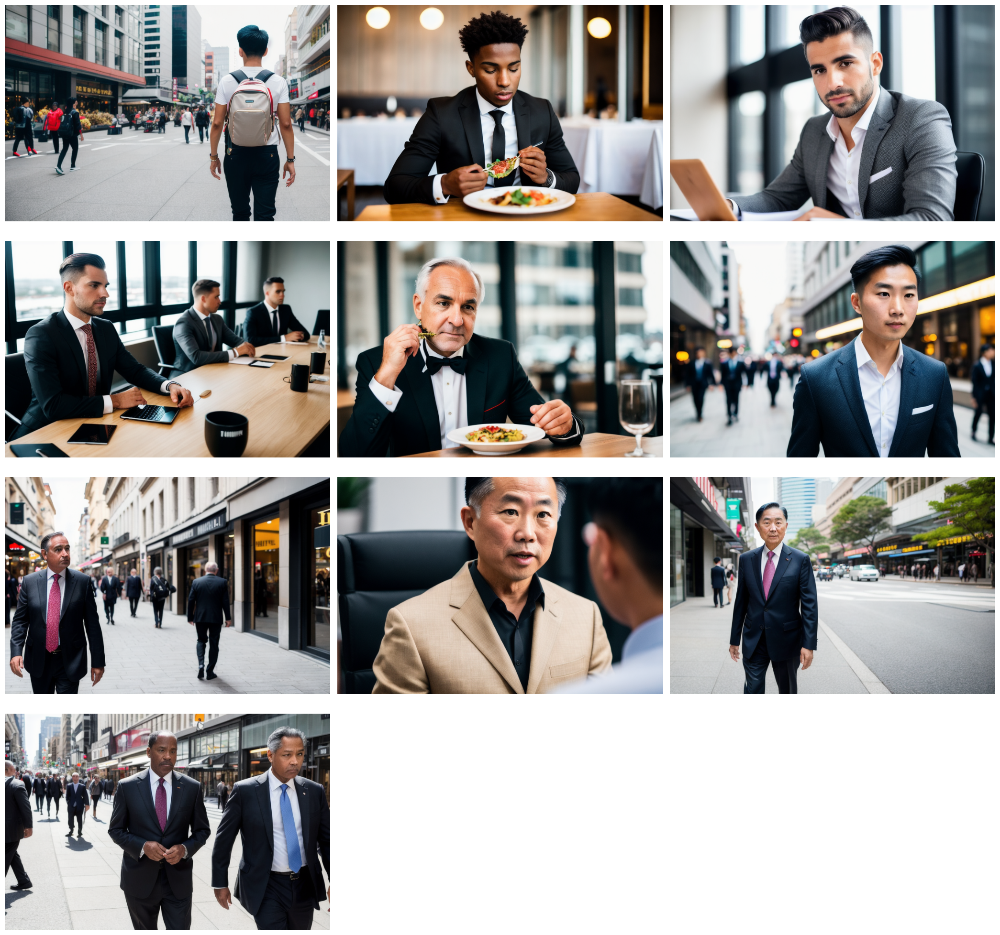

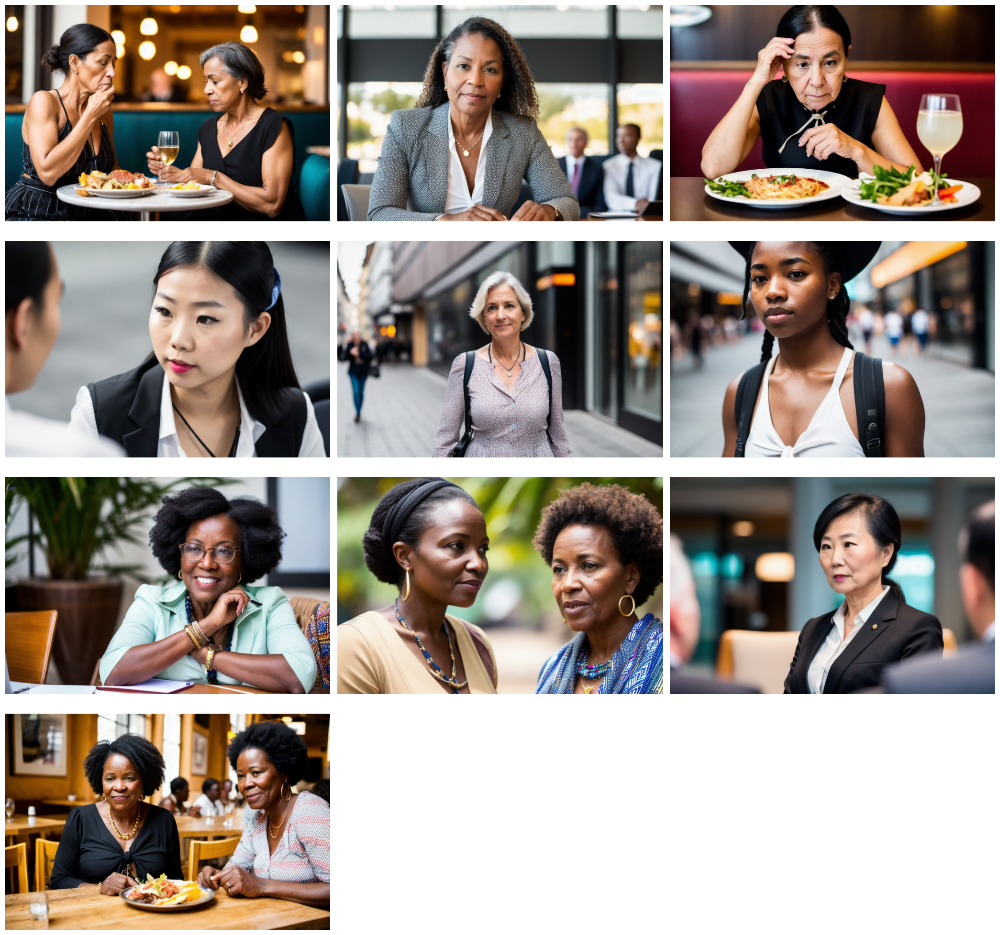

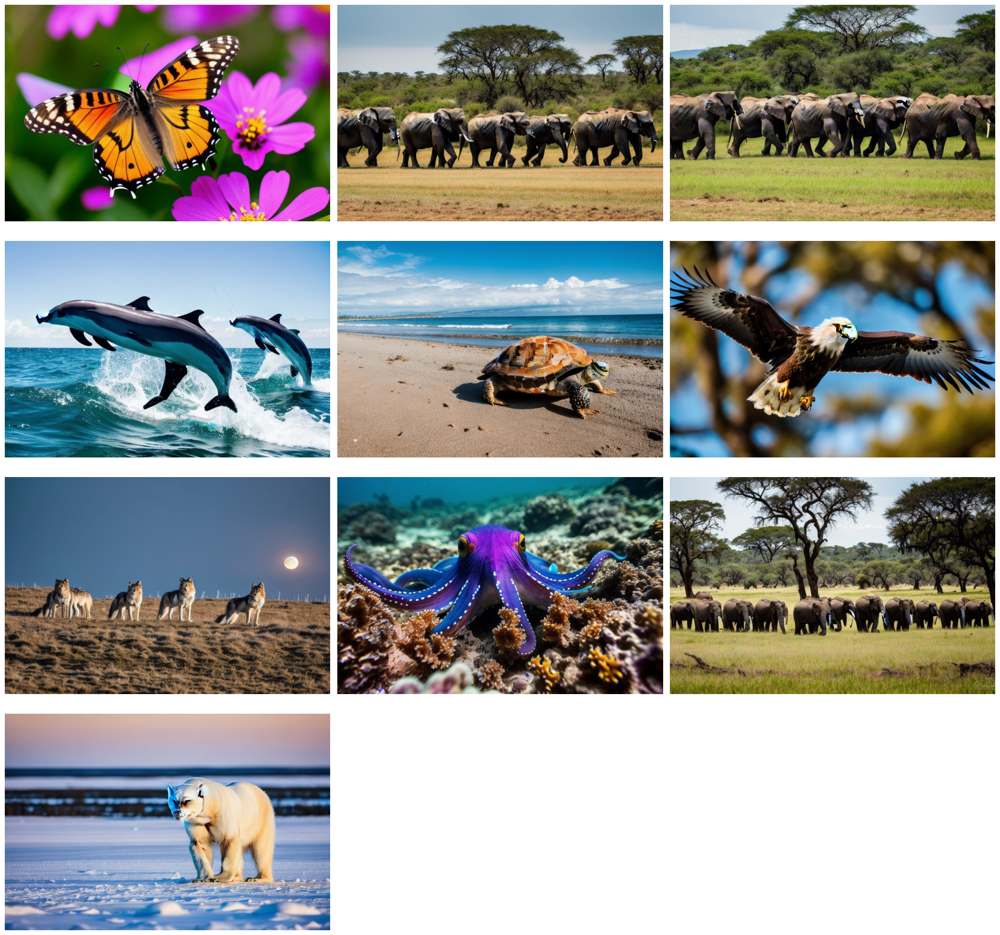

In [48]:
for classname in classes:
    image_path = os.path.join(root, classname)
    image_list = [os.path.join(image_path, image) for image in os.listdir(image_path) if image.endswith('.png')]

    show_images(images=image_list, cols=3, source='local')